### Introduction to COVID-19
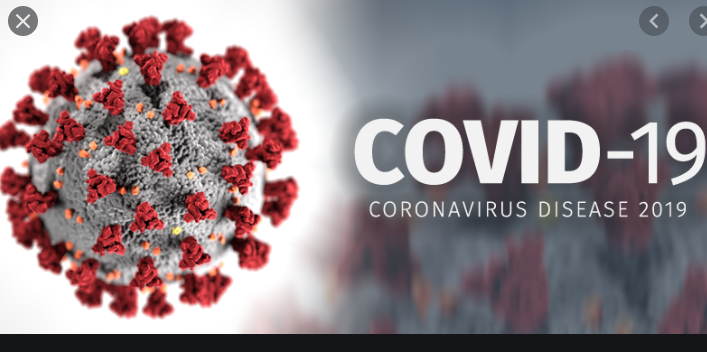

Coronavirus is a family of viruses that can cause illness, which can vary from common cold and cough to sometimes more severe disease. Middle East Respiratory Syndrome (MERS-CoV) and Severe Acute Respiratory Syndrome (SARS-CoV) were such severe cases with the world already has faced.
SARS-CoV-2 (n-coronavirus) is the new virus of the coronavirus family, which first discovered in 2019, which has not been identified in humans before. It is a contiguous virus which started from Wuhan in December 2019. Which later declared as Pandemic by WHO due to high rate spreads throughout the world. Currently (on date 27 March 2020), this leads to a total of 24K+ Deaths across the globe, including 16K+ deaths alone in Europe.
Pandemic is spreading all over the world; it becomes more important to understand about this spread. This NoteBook is an effort to analyze the cumulative data of confirmed, deaths, and recovered cases over time. In this notebook, the main focus is to analyze the spread trend of this virus all over the world.

### Downloading and Installing Prerequisites

#### Download Pretrained Models from GitHub:

    model_confirmed.h5
    model_deaths.h5

In [1]:
!pip install pycountry_convert 
!pip install folium
!wget https://raw.githubusercontent.com/tarunk04/COVID-19-CaseStudy-and-Predictions/master/models/model_deaths.h5
!wget https://raw.githubusercontent.com/tarunk04/COVID-19-CaseStudy-and-Predictions/master/models/model_confirmed.h5
!wget https://raw.githubusercontent.com/tarunk04/COVID-19-CaseStudy-and-Predictions/master/models/model_usa_c.h5

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


### Importing python libraries and datasets

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import ticker
import pycountry_convert as pc
import folium
!pip install branca
import branca

In [3]:
from datetime import datetime, timedelta, date
from scipy.interpolate import make_interp_spline, BSpline
!pip install plotly
import plotly.express as px
import json, requests

In [5]:
from keras.layers import Input, Dense, Activation, LeakyReLU
from keras import models
from keras.optimizers import RMSprop, Adam

Using TensorFlow backend.


In [6]:
df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_confirmed.head(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,40,74,84,94,110,110,120,170,174,237
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,104,123,146,174,186,197,212,223,243,259
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,230,264,302,367,409,454,511,584,716,847
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,133,164,188,224,267,308,334,370,376,390
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,3,3,3,4,4,5,7,7,7,8


In [10]:
df_deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
print('Time series of Covid-19 Deaths: \n')
df_deaths.head(5)

Time series of Covid-19 Deaths: 



,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,1,1,2,4,4,4,4,4,4,4
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,4,5,5,6,8,10,10,11,15,15
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,17,19,21,25,26,29,31,35,44,58
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,1,1,1,3,3,3,6,8,12,14
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,0,0,0,0,0,0,2,2,2,2


In [9]:
df_covid19 = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")
print('Covid 19 Dataset: \n')
df_covid19.head()

Covid 19 Dataset: 



,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active
0,Australia,2020-04-02 02:53:53,-25.0000,133.0000,4862,20,422,4420
1,Austria,2020-04-02 02:47:12,47.5162,14.5501,10711,146,1436,9129
2,Canada,2020-04-02 02:53:39,60.0010,-95.0010,9731,112,1435,0
3,China,2020-04-02 01:38:02,30.5928,114.3055,82392,3316,76420,2656
4,Denmark,2020-04-02 02:47:12,56.0000,10.0000,3290,104,971,2215


In [11]:
df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])
df_table.head()

,Country_Region,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered
0,Afghanistan,2020-01-22,0,0,NaN,NaN,0,NaN
1,Afghanistan,2020-01-23,0,0,NaN,NaN,0,NaN
2,Afghanistan,2020-01-24,0,0,NaN,NaN,0,NaN
3,Afghanistan,2020-01-25,0,0,NaN,NaN,0,NaN
4,Afghanistan,2020-01-26,0,0,NaN,NaN,0,NaN


In [12]:
df_table = df_table[df_table["Country_Region"] != "Others"]

Finding country wise information

In [13]:
df_countries_cases = df_covid19.copy().drop(['Lat','Long_','Last_Update'],axis =1)

In [14]:
df_countries_cases.index = df_countries_cases["Country_Region"]
df_countries_cases= df_countries_cases.drop("Country_Region", axis=1)
df_countries_cases.head()

,Confirmed,Deaths,Recovered,Active
Country_Region,,,,
Australia,4862,20,422,4420
Austria,10711,146,1436,9129
Canada,9731,112,1435,0
China,82392,3316,76420,2656
Denmark,3290,104,971,2215


### Global cases reported till Date

Total number of Confirmed, Deaths, Recovered and Active cases across the globe

In [15]:
globalcases_df = pd.DataFrame(df_countries_cases.sum()).transpose().style.background_gradient(cmap='Wistia',axis=1)
globalcases_df

,Confirmed,Deaths,Recovered,Active
0,937091,47231,193764,485109


### Country Wise Reported Cases
Country Wise reported confirmed cases, recovered cases, deaths, active cases

In [16]:
df_countries_cases.sort_values('Confirmed', ascending= False).style.background_gradient(cmap='Wistia')

,Confirmed,Deaths,Recovered,Active
Country_Region,,,,
US,216515,5119,8593,0
Italy,110574,13155,16847,80572
Spain,104118,9387,22647,72084
China,82392,3316,76420,2656
Germany,77981,931,18700,58350
France,57763,4043,11055,42665
Iran,47593,3036,15473,29084
United Kingdom,29865,2357,179,27329
Switzerland,17768,488,2967,14313


### Top 10 countries with Confirmed, Deaths, Recovered, Active cases

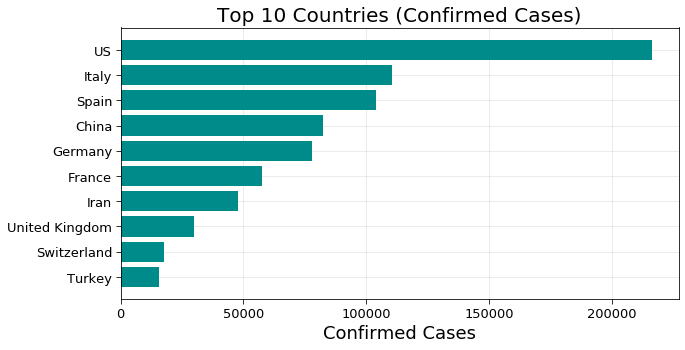

In [17]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-10:],df_countries_cases.sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 Countries (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 Countries (Confirmed Cases).png')

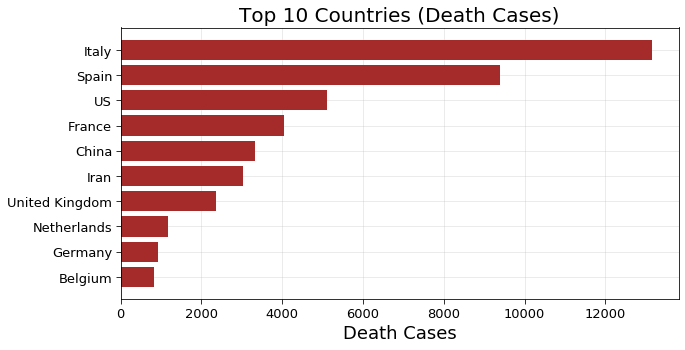

In [18]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Deaths')["Deaths"].index[-10:],df_countries_cases.sort_values('Deaths')["Deaths"].values[-10:],color="brown")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Death Cases",fontsize=18)
plt.title("Top 10 Countries (Death Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 Countries (Confirmed Cases).png')

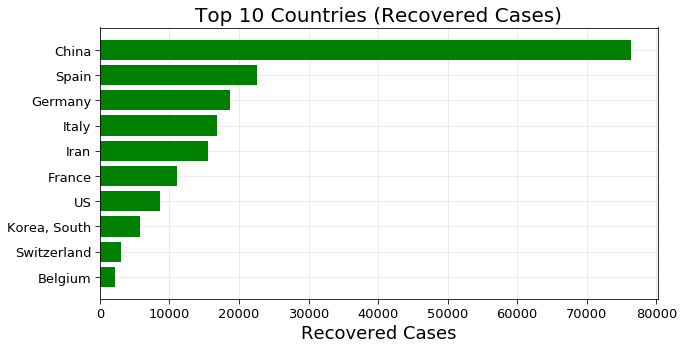

In [19]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Recovered')["Recovered"].index[-10:],df_countries_cases.sort_values('Recovered')["Recovered"].values[-10:],color="green")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Recovered Cases",fontsize=18)
plt.title("Top 10 Countries (Recovered Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 Countries (Confirmed Cases).png')

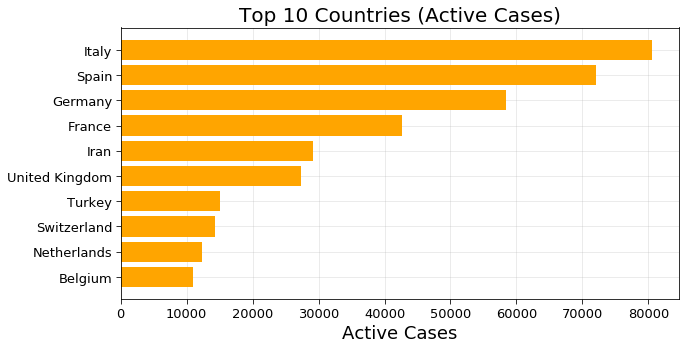

In [20]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Active')["Active"].index[-10:],df_countries_cases.sort_values('Active')["Active"].values[-10:],color="orange")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Active Cases",fontsize=18)
plt.title("Top 10 Countries (Active Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 Countries (Confirmed Cases).png')

### Correlation Analysis using Heatmap
Heat map on correlation of confirmed, recovered, deaths and active COVID-19 cases

In [21]:
df_countries_cases.corr().style.background_gradient(cmap='Reds')

,Confirmed,Deaths,Recovered,Active
Confirmed,1,0.788443,0.57601,0.619826
Deaths,0.788443,1,0.521151,0.8422
Recovered,0.57601,0.521151,1,0.417125
Active,0.619826,0.8422,0.417125,1


### Visualization on world map using Folium

In [22]:
world_map = folium.Map(location=[10,0], tiles="cartodbpositron", zoom_start=2,max_zoom=6,min_zoom=2)
for i in range(0,len(df_confirmed)):
    folium.Circle(
        location=[df_confirmed.iloc[i]['Lat'], df_confirmed.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_confirmed.iloc[i]['Country/Region']+"</h5>"+
                    "<div style='text-align:center;'>"+str(np.nan_to_num(df_confirmed.iloc[i]['Province/State']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_confirmed.iloc[i,-1])+"</li>"+
        "<li>Deaths:   "+str(df_deaths.iloc[i,-1])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df_deaths.iloc[i,-1]/(df_confirmed.iloc[i,-1]+1.00001)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int((np.log(df_confirmed.iloc[i,-1]+1.00001)))+0.2)*50000,
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(world_map)

world_map

### Progression of COVID spreading worldwide

In [23]:
df_data = df_table.groupby(['Last_Update', 'Country_Region'])['Confirmed', 'Deaths'].max().reset_index()
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(df_data, locations="Country_Region", locationmode='country names', 
                     color=np.power(df_data["Confirmed"],0.3)-2 , size= np.power(df_data["Confirmed"]+1,0.3)-1, hover_name="Country_Region",
                     hover_data=["Confirmed"],
                     range_color= [0, max(np.power(df_data["Confirmed"],0.3))], 
                     projection="natural earth", animation_frame="Last_Update", 
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title='COVID-19: Progression of spreading worldwide'
                    )
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.show()

#### Severity of COVID-19 across globe using Heatmap

In [34]:
temp_df = pd.DataFrame(df_countries_cases['Confirmed'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="Country_Region",
                    color=np.log10(temp_df.iloc[:,-1]), # lifeExp is a column of gapminder
                    hover_name="Country_Region", # column to add to hover information
                    hover_data=["Confirmed"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Confirmed Cases across globe")
fig.update_coloraxes(colorbar_title="Confirmed Cases across globe",colorscale="Reds")
# fig.to_image("Global Heat Map confirmed.png")
fig.show()

In [33]:
temp_df = pd.DataFrame(df_countries_cases['Deaths'])
temp_df = temp_df.reset_index()
fig = px.choropleth(temp_df, locations="Country_Region",
                    color=np.log10(temp_df.iloc[:,-1]), # lifeExp is a column of gapminder
                    hover_name="Country_Region", # column to add to hover information
                    hover_data=["Deaths"],
                    color_continuous_scale=px.colors.sequential.Plasma,locationmode="country names")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Death Cases across globe")
fig.update_coloraxes(colorbar_title="Death Cases across globe",colorscale="Reds")
# fig.to_image("Global Heat Map confirmed.png")
fig.show()

# COVID-19 : INDIA
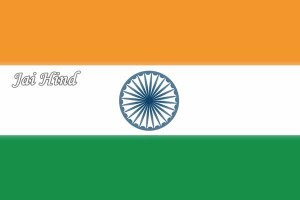

#### Dataset:
This dataset is provided by API for COVID-19 stats in India, sourced from The Ministry of Health and Family Welfare and separately from unofficial sources https://api.rootnet.in/

In [36]:
df_covid19_india_test = pd.io.json.json_normalize(requests.get('https://api.rootnet.in/covid19-in/stats/testing/history').json()['data']).rename(columns = {"totalIndividualsTested":"covid_individualtested","totalPositiveCases":"corona_positives","totalSamplesTested":"totalsamplestested"})
df_covid19_india_test.head()

,day,totalsamplestested,covid_individualtested,corona_positives,source
0,2020-03-12,6500,5900,78,Press_Release_ICMR_13March2020.pdf
1,2020-03-18,13125,12235,150,ICMR_website_update_18March_6PM_IST.pdf
2,2020-03-19,14175,13285,182,ICMR_website_update_19March_6PM_IST.pdf
3,2020-03-20,15404,14514,236,ICMR_website_update_20March_6PM_IST.pdf
4,2020-03-21,16911,16021,315,ICMR_website_update_21March_6PM_IST.pdf


In [37]:
df_covid19_india_test["pt_ratio"]= np.round(100*df_covid19_india_test["corona_positives"]/df_covid19_india_test["totalsamplestested"],2)
df_covid19_india_test["positive"] = df_covid19_india_test["corona_positives"].diff()
df_covid19_india_test["tests"] = df_covid19_india_test["totalsamplestested"].diff()
df_covid19_india_test["pt_ratio"]= np.round(100*df_covid19_india_test["positive"]/df_covid19_india_test["tests"],2)

In [42]:
df_covid19_india_test.tail()

,day,totalsamplestested,covid_individualtested,corona_positives,source,pt_ratio,positive,tests
8,2020-03-25,22928,22038,539,ICMR_website_update_25March_10AM_IST.pdf,1.28,3.0,234.0
9,2020-03-27,27688,26798,691,https://icmr.nic.in/sites/default/files/whats_...,3.19,152.0,4760.0
10,2020-03-30,38442,37000,1334,https://www.youtube.com/watch?v=yvJY0LuM8kQ&fe...,5.98,643.0,10754.0
11,2020-03-31,42788,41000,1533,MOH announcement,4.58,199.0,4346.0
12,2020-04-01,47951,46000,1637,MOH announcement,2.01,104.0,5163.0


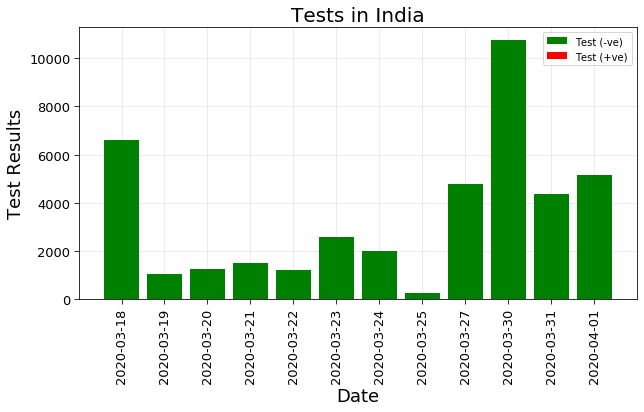

In [40]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.bar(df_covid19_india_test["day"],df_covid19_india_test["tests"].values[:],color="Green",label="Test (-ve)"+str())
plt.bar(df_covid19_india_test["day"],df_covid19_india_test["positive"].values[:],bottom=df_covid19_india_test["tests"].values[:]-df_covid19_india_test["positive"].values[:],color="Red",label="Test (+ve)")
plt.tick_params(size=5,labelsize = 13)
plt.tick_params(axis="x",size=5,labelsize = 13,labelrotation=90 )
plt.xlabel("Date",fontsize=18)
plt.ylabel("Test Results",fontsize=18)

plt.title("Tests in India",fontsize=20)
plt.grid(alpha=0.3)
plt.legend()
#plt.savefig(out+'Test_India.png')

#### Total samples tested till April 1,2020

In [41]:
df_covid19_india_test["totalsamplestested"][-1:].values[0]

47951

## COVID19 Cases in India

In [47]:
india_data_json = requests.get('https://api.rootnet.in/covid19-in/unofficial/covid19india.org/statewise').json()
df_india_cases = pd.io.json.json_normalize(india_data_json['data']['statewise'])
df_india_cases = df_india_cases.set_index("state")
df_india_cases.head()

,confirmed,recovered,deaths,active
state,,,,
Maharashtra,338,39,14,285
Kerala,265,26,2,237
Tamil Nadu,234,6,1,227
Delhi,152,6,2,144
Rajasthan,129,3,0,126


In [48]:
total = df_india_cases.sum()
total.name = "Total"
pd.DataFrame(total).transpose().style.background_gradient(cmap='Wistia',axis=1)

,confirmed,recovered,deaths,active
Total,2094,171,57,1866


In [49]:
total

confirmed    2094
recovered     171
deaths         57
active       1866
Name: Total, dtype: int64

In [51]:
df_india_cases.style.background_gradient(cmap='Wistia')

,confirmed,recovered,deaths,active
state,,,,
Maharashtra,338,39,14,285
Kerala,265,26,2,237
Tamil Nadu,234,6,1,227
Delhi,152,6,2,144
Rajasthan,129,3,0,126
Uttar Pradesh,117,17,2,98
Andhra Pradesh,132,2,0,130
Karnataka,110,9,3,98
Telangana,127,14,6,107


#### States with reported deaths

In [52]:
df_india_cases[df_india_cases["deaths"] > 0].style.background_gradient(cmap = 'Wistia')

,confirmed,recovered,deaths,active
state,,,,
Maharashtra,338,39,14,285
Kerala,265,26,2,237
Tamil Nadu,234,6,1,227
Delhi,152,6,2,144
Uttar Pradesh,117,17,2,98
Karnataka,110,9,3,98
Telangana,127,14,6,107
Gujarat,87,7,7,73
Madhya Pradesh,98,0,6,92


### Top 10 states in India affected by COVID-19

#### States with Confirmed cases

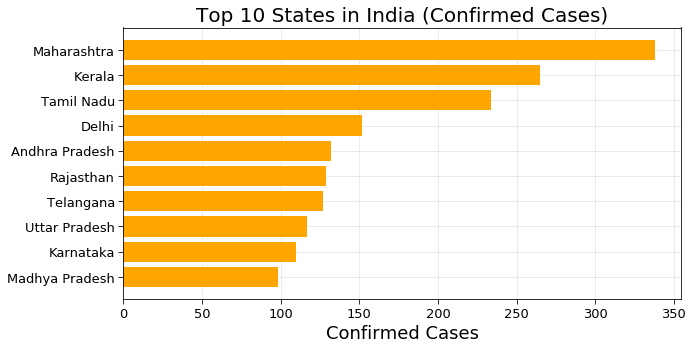

In [64]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_india_cases.sort_values('confirmed')["confirmed"].index[-10:],df_india_cases.sort_values('confirmed')["confirmed"].values[-10:],color="orange")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 States in India (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 States_India (Confirmed Cases).png')

#### States with Death cases

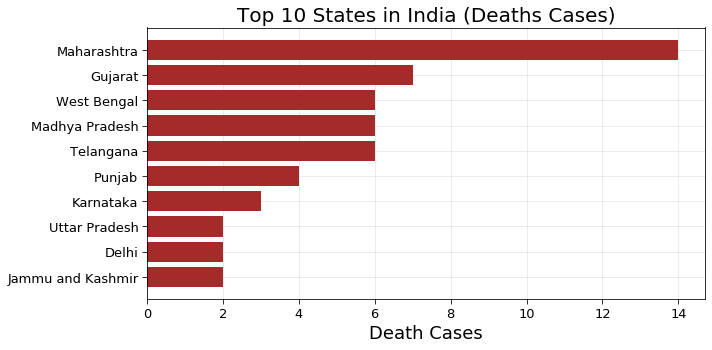

In [65]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_india_cases.sort_values('deaths')["deaths"].index[-10:],df_india_cases.sort_values('deaths')["deaths"].values[-10:],color="brown")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Death Cases",fontsize=18)
plt.title("Top 10 States in India (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 States_India (Confirmed Cases).png')

#### Correlation using Heatmap

In [67]:
df_india_cases.corr().style.background_gradient(cmap='Reds')

,confirmed,recovered,deaths,active
confirmed,1,0.759522,0.64602,0.995955
recovered,0.759522,1,0.609017,0.701158
deaths,0.64602,0.609017,1,0.606348
active,0.995955,0.701158,0.606348,1


In [78]:
# Adding states geolocation(Latitude,Longitude) data to India dataset
geolocations = {
    "Kerala" : [10.8505,76.2711],
    "Maharashtra" : [19.7515,75.7139],
    "Karnataka": [15.3173,75.7139],
    "Telangana": [18.1124,79.0193],
    "Uttar Pradesh": [26.8467,80.9462],
    "Rajasthan": [27.0238,74.2179],
    "Gujarat":[22.2587,71.1924],
    "Delhi" : [28.7041,77.1025],
    "Punjab":[31.1471,75.3412],
    "Tamil Nadu": [11.1271,78.6569],
    "Haryana": [29.0588,76.0856],
    "Madhya Pradesh":[22.9734,78.6569],
    "Jammu and Kashmir":[33.7782,76.5762],
    "Ladakh": [34.1526,77.5770],
    "Andhra Pradesh":[15.9129,79.7400],
    "West Bengal": [22.9868,87.8550],
    "Bihar": [25.0961,85.3131],
    "Chhattisgarh":[21.2787,81.8661],
    "Chandigarh":[30.7333,76.7794],
    "Uttarakhand":[30.0668,79.0193],
    "Himachal Pradesh":[31.1048,77.1734],
    "Goa": [15.2993,74.1240],
    "Odisha":[20.9517,85.0985],
    "Andaman and Nicobar Islands": [11.7401,92.6586],
    "Puducherry":[11.9416,79.8083],
    "Manipur":[24.6637,93.9063],
    "Mizoram":[23.1645,92.9376],
    "Assam":[26.2006,92.9376],
    "Meghalaya":[25.4670,91.3662],
    "Tripura":[23.9408,91.9882],
    "Arunachal Pradesh":[28.2180,94.7278],
    "Jharkhand" : [23.6102,85.2799],
    "Nagaland": [26.1584,94.5624],
    "Sikkim": [27.5330,88.5122],
    "Dadra and Nagar Haveli":[20.1809,73.0169],
    "Lakshadweep":[10.5667,72.6417],
    "Daman and Diu":[20.4283,72.8397]    
}
df_india_cases["Lat"] = ""
df_india_cases["Long"] = ""
for index in df_india_cases.index :
    df_india_cases.loc[df_india_cases.index == index,"Lat"] = geolocations[index][0]
    df_india_cases.loc[df_india_cases.index == index,"Long"] = geolocations[index][1]

#### Visualization using Folium map for statewise

In [90]:
# url = "https://raw.githubusercontent.com/Subhash9325/GeoJson-Data-of-Indian-States/master/Indian_States"
# state_json = requests.get(url).json()
india = folium.Map(location=[23,80], zoom_start=4,max_zoom=10, tiles='OpenStreetMap', attr= "INDIA" ,min_zoom=4,height=500,width="80%")
for i in range(0,len(df_india_cases[df_india_cases['confirmed']>0].index)):
    folium.Circle(
        location=[df_india_cases.iloc[i]['Lat'], df_india_cases.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_india_cases.iloc[i].name+"</h5>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_india_cases.iloc[i]['confirmed'])+"</li>"+
        "<li>Active:   "+str(df_india_cases.iloc[i]['active'])+"</li>"+
        "<li>Recovered:   "+str(df_india_cases.iloc[i]['recovered'])+"</li>"+
        "<li>Deaths:   "+str(df_india_cases.iloc[i]['deaths'])+"</li>"+
        
        "<li>Mortality Rate:   "+str(np.round(df_india_cases.iloc[i]['deaths']/(df_india_cases.iloc[i]['confirmed']+1)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int(np.log2(df_india_cases.iloc[i]['confirmed']+1)))*15000,
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(india)

india

# COVID-19 US 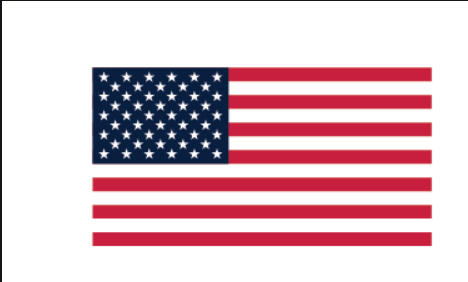

#### Load US dataset

In [92]:
df_temp = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/03-31-2020.csv")
df_usa_cases = df_temp.loc[df_temp["Country_Region"]== "US"]
df_usa_cases = df_usa_cases.rename(columns={"Admin2":"County"})
df_usa_cases.head()

,FIPS,County,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key
0,45001.0,Abbeville,South Carolina,US,2020-03-31 23:43:56,34.223334,-82.461707,4,0,0,0,"Abbeville, South Carolina, US"
1,22001.0,Acadia,Louisiana,US,2020-03-31 23:43:56,30.295065,-92.414197,39,1,0,0,"Acadia, Louisiana, US"
2,51001.0,Accomack,Virginia,US,2020-03-31 23:43:56,37.767072,-75.632346,7,0,0,0,"Accomack, Virginia, US"
3,16001.0,Ada,Idaho,US,2020-03-31 23:43:56,43.452658,-116.241552,195,3,0,0,"Ada, Idaho, US"
4,19001.0,Adair,Iowa,US,2020-03-31 23:43:56,41.330756,-94.471059,1,0,0,0,"Adair, Iowa, US"


In [93]:
total = df_usa_cases.sum()
total


FIPS                                                    6.36648e+07
Province_State    South CarolinaLouisianaVirginiaIdahoIowaMissou...
Country_Region    USUSUSUSUSUSUSUSUSUSUSUSUSUSUSUSUSUSUSUSUSUSUS...
Last_Update       2020-03-31 23:43:562020-03-31 23:43:562020-03-...
Lat                                                         81041.2
Long_                                                       -193009
Confirmed                                                    188172
Deaths                                                         3873
Recovered                                                      7024
Active                                                            0
Combined_Key      Abbeville, South Carolina, USAcadia, Louisiana...
dtype: object

In [94]:
total.name = "Total"
pd.DataFrame(total).transpose().loc[:,["Confirmed","Deaths"]].style.background_gradient(cmap='Wistia',axis=1)

,Confirmed,Deaths
Total,188172,3873


In [95]:
df_usa_cases.loc[:,["Confirmed","Deaths","Province_State"]].groupby(["Province_State"]).sum().sort_values("Confirmed",ascending=False).style.background_gradient(cmap='Wistia')

,Confirmed,Deaths
Province_State,,
New York,75833,1550
New Jersey,18696,267
California,8210,173
Michigan,7615,259
Florida,6741,85
Massachusetts,6620,89
Illinois,5994,99
Washington,5432,225
Louisiana,5237,239


### Top 15 affected US Cities

In [96]:
df_usa_cases.loc[:,["Province_State","Confirmed","Deaths","County"]].sort_values("Confirmed",ascending=False).set_index("County")[:15].style.background_gradient(cmap='Wistia')

,Province_State,Confirmed,Deaths
County,,,
New York City,New York,43119,932
Westchester,New York,9967,10
Nassau,New York,8544,48
Suffolk,New York,6713,44
Cook,Illinois,4496,61
Wayne,Michigan,3735,120
Unassigned,New Jersey,3686,247
Los Angeles,California,3019,54
Bergen,New Jersey,2909,4


### Most affected states in US with COVID cases

#### Confirm cases

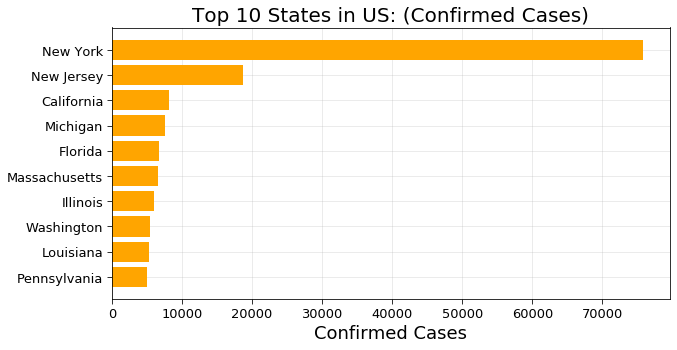

In [97]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_usa_cases.groupby(["Province_State"]).sum().sort_values('Confirmed')["Confirmed"].index[-10:],df_usa_cases.groupby(["Province_State"]).sum().sort_values('Confirmed')["Confirmed"].values[-10:],color="orange")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 States in US: (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 States in US (Confirmed Cases).png')

#### Death cases

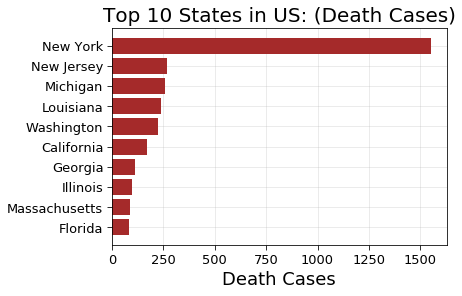

In [98]:

f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_usa_cases.groupby(["Province_State"]).sum().sort_values('Deaths')["Deaths"].index[-10:],df_usa_cases.groupby(["Province_State"]).sum().sort_values('Deaths')["Deaths"].values[-10:],color="brown")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Death Cases",fontsize=18)
plt.title("Top 10 States in US: (Death Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 States in US (Death Cases).png')

In [99]:
# url = "https://raw.githubusercontent.com/Subhash9325/GeoJson-Data-of-Indian-States/master/Indian_States"
# state_json = requests.get(url).json()
df_usa_cases = df_usa_cases.replace(np.nan, 0, regex=True)
usa = folium.Map(location=[37, -102], zoom_start=4,max_zoom=8,min_zoom=4)
for i in np.int32(np.asarray(df_usa_cases[df_usa_cases['Confirmed'] > 0].index)):
    folium.Circle(
        location=[df_usa_cases.loc[i]['Lat'], df_usa_cases.loc[i]['Long_']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_usa_cases.loc[i]['Province_State']+"</h5>"+
                    "<div style='text-align:center;'>"+str(np.nan_to_num(df_usa_cases.loc[i]['County']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_usa_cases.loc[i]['Confirmed'])+"</li>"+
        "<li>Active:   "+str(df_usa_cases.loc[i]['Active'])+"</li>"+
        "<li>Recovered:   "+str(df_usa_cases.loc[i]['Recovered'])+"</li>"+       
        "<li>Deaths:   "+str(df_usa_cases.loc[i]['Deaths'])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df_usa_cases.loc[i]['Deaths']/(df_usa_cases.loc[i]['Confirmed']+1)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int(np.log2(df_usa_cases.loc[i]['Confirmed']+1)))*6000,
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(usa)

usa

In [103]:
data_y = np.log10(np.asarray(df_confirmed.sum()[5:]).astype("float32"))
data_x = np.arange(1,len(data_y)+1)

### Graph for COVID-19 cases all over the world

In [135]:
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})
    
    # Yaxis sacle
    plt.yscale(scale)
    plt.minorticks_on()
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)

In [139]:
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["darkcyan","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19 Cases for "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()

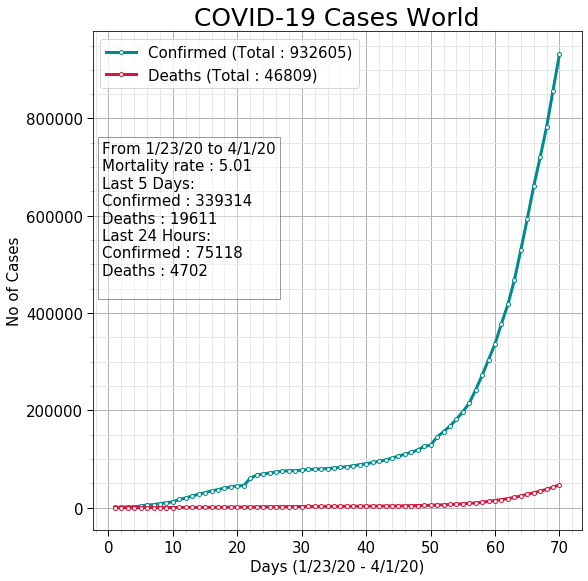

In [137]:
cols = 1
rows = 1
f = plt.figure(figsize=(10,10*rows))
visualize_covid_cases(df_confirmed, df_deaths,continent = "All",figure = [f,rows,cols, 1])

#plt.savefig(out+'COIVD-19-World.png')
plt.show()

#### Loading Pre trained Model (model_confirmed.h5)

In [101]:
model = models.load_model("model_confirmed.h5")
model.summary()












_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 1)                 81        
_________________________________________________________________
Output (LeakyReLU)           (None, 1)                 0         

In [141]:
model2 = models.load_model("model_deaths.h5")
model2.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 1)                 81        
_________________________________________________________________
Output (LeakyReLU)           (None, 1)                 0         
Total para

# Predictions for COVID-19 cases

## 1. Prediction cases for COVID-19 globally

## Using Moving Average and Exponential Weighted Moving Average models

In [149]:
def cal_moving_avg(input_df, window=2):
    """Calculates Moving avg using the window size."""
    _df = input_df.rolling(window, axis=1).median()['4/1/20']
    
    return _df

def cal_ewma(input_df, comm=0.3):
    """Calculates the exp weighted moving average using the window size."""
    _df = input_df.ewm(com=comm).mean()['4/1/20']
    
    return _df

In [151]:
all_pred_df = pd.DataFrame()
all_pred_df_ew = pd.DataFrame()

for df in [df_confirmed, df_deaths]:
    _df = cal_moving_avg(df, window=2)
    ew_df = cal_ewma(df, comm=0.4)
    all_pred_df = pd.concat([all_pred_df, _df], axis=1)
    all_pred_df_ew = pd.concat([all_pred_df_ew, ew_df], axis=1)
    
all_pred_df.columns =['Confirmed', 'Deaths']    
all_pred_df_ew.columns =['Confirmed', 'Deaths']    

In [173]:
print('\n')
print('COVID-19 cases worldwide till 1/4/2020 using Moving Average:')
all_pred_df



COVID-19 cases worldwide till 1/4/2020 using Moving Average:


,Confirmed,Deaths
0,205.5,4.0
1,251.0,15.0
2,781.5,51.0
3,383.0,13.0
4,7.5,2.0
...,...,...
251,5.5,0.0
252,5.5,1.0
253,4.0,1.0
254,2.0,0.0


In [174]:
print('\n')
print('COVID-19 cases worldwide till 1/4/2020 using EWMA:')
all_pred_df_ew



COVID-19 cases worldwide till 1/4/2020 using EWMA:


,Confirmed,Deaths
0,237.000000,4.000000
1,254.111111,12.555556
2,687.716418,45.791045
3,473.635220,22.930818
4,140.404173,7.951714
...,...,...
251,5.869350,0.021517
252,8.105529,1.434719
253,5.173008,1.124206
254,2.906574,0.321202


### 2. Prediction cases for COVID-19 in India

In [176]:
ind_conf = df_confirmed[df_confirmed['Country/Region'] == 'India']
ind_conf

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
131,NaN,India,21.0,78.0,0,0,0,0,0,0,...,499,536,657,727,887,987,1024,1251,1397,1998


In [177]:
ind_deaths = df_deaths[df_deaths['Country/Region'] == 'India']
ind_deaths

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
131,NaN,India,21.0,78.0,0,0,0,0,0,0,...,10,10,12,20,20,24,27,32,35,58


#### Use Moving Average and EWMA models¶

In [175]:
def cal_moving_avg(input_df, window=2):
    """Calculates Moving avg using the window size."""
    _df = input_df.rolling(window, axis=1).median()['4/1/20']
    
    return _df

def cal_ewma(input_df, comm=0.3):
    """Calculates the exp weighted moving average using the window size."""
    _df = input_df.ewm(com=comm).mean()['4/1/20']
    
    return _df

In [179]:
ind_all_pred_df = pd.DataFrame()
ind_all_pred_df_ew = pd.DataFrame()

for df in [ind_conf, ind_deaths]:
    _df = cal_moving_avg(df, window=2)
    ew_df = cal_ewma(df, comm=0.4)
    ind_all_pred_df = pd.concat([ind_all_pred_df, _df], axis=1)
    ind_all_pred_df_ew = pd.concat([ind_all_pred_df_ew, ew_df], axis=1)
    
ind_all_pred_df.columns =['Confirmed', 'Deaths']    
ind_all_pred_df_ew.columns =['Confirmed', 'Deaths'] 

In [180]:
print('\n')
print('COVID-19 cases in India till 1/4/2020 using MA:')
ind_all_pred_df



COVID-19 cases in India till 1/4/2020 using MA:


,Confirmed,Deaths
131,1697.5,46.5


In [181]:
print('\n')
print('COVID-19 cases in US till 1/4/2020 using EWMA:')
ind_all_pred_df_ew



COVID-19 cases in US till 1/4/2020 using EWMA:


,Confirmed,Deaths
131,1998.0,58.0


### 3. Prediction cases for COVID-19 in US

In [168]:
us_conf = df_confirmed[df_confirmed['Country/Region'] == 'US']
us_conf

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
225,NaN,US,37.0902,-95.7129,1,1,2,2,5,5,...,43847,53740,65778,83836,101657,121478,140886,161807,188172,213372


In [169]:
us_deaths = df_deaths[df_deaths['Country/Region'] == 'US']
us_deaths

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20
225,NaN,US,37.0902,-95.7129,0,0,0,0,0,0,...,557,706,942,1209,1581,2026,2467,2978,3873,4757


### Use Moving Average and EWMA models

In [163]:
def cal_moving_avg(input_df, window=2):
    """Calculates Moving avg using the window size."""
    _df = input_df.rolling(window, axis=1).median()['4/1/20']
    
    return _df

def cal_ewma(input_df, comm=0.3):
    """Calculates the exp wighted moving average using the window size."""
    _df = input_df.ewm(com=comm).mean()['4/1/20']
    
    return _df

In [170]:
us_all_pred_df = pd.DataFrame()
us_all_pred_df_ew = pd.DataFrame()

for df in [us_conf, us_deaths]:
    _df = cal_moving_avg(df, window=2)
    ew_df = cal_ewma(df, comm=0.4)
    us_all_pred_df = pd.concat([us_all_pred_df, _df], axis=1)
    us_all_pred_df_ew = pd.concat([us_all_pred_df_ew, ew_df], axis=1)
    
us_all_pred_df.columns =['Confirmed', 'Deaths']    
us_all_pred_df_ew.columns =['Confirmed', 'Deaths']    

In [171]:
print('\n')
print('COVID-19 cases in US till 1/4/2020 using MA:')
us_all_pred_df



COVID-19 cases in US till 1/4/2020 using MA:


,Confirmed,Deaths
225,200772.0,4315.0


In [172]:
print('\n')
print('COVID-19 cases in US till 1/4/2020 using EWMA:')
us_all_pred_df_ew



COVID-19 cases in US till 1/4/2020 using EWMA:


,Confirmed,Deaths
225,213372.0,4757.0


## Save the results into excel file

In [189]:
!pip install openpyxl
all_pred_df.to_excel("COVID19_Global_Cases.xlsx", index = False)